# CLIP-guided Collage

## "Arrange given small images on a canvas so that the collage looks like XXXX as much as possible!!"

Nao Tokui ([@naotokui_en](https://twitter.com/naotokui_en))

Reference:     
[OpenAI, CLIP: Connecting Text and Images](https://openai.com/blog/clip/).    
[YINGTAO TIAN & DAVID HA, Modern Evolution Strategies for Creativity: Fitting Concrete Images and Abstract Concepts](https://es-clip.github.io/).    
[PGPELib: A mini library for Policy Gradients with Parameter-based Exploration and friends.](https://github.com/nnaisense/pgpelib)


In [57]:
!pip install torch
!pip install ftfy 
!pip install tqdm
!pip install git+https://github.com/openai/CLIP.git
!pip install torchvision
!pip install scikit-learn
!pip install joblib
!pip install git+https://github.com/nnaisense/pgpelib.git#egg=pgpelib

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-cksg3rbx
  Running command git clone -q https://github.com/openai/CLIP.git /tmp/pip-req-build-cksg3rbx
  Cloning https://github.com/nnaisense/pgpelib.git to /tmp/pip-install-aghjaggw/pgpelib_afa5132349df41908bab5950c47ff3f3
  Running command git clone -q https://github.com/nnaisense/pgpelib.git /tmp/pip-install-aghjaggw/pgpelib_afa5132349df41908bab5950c47ff3f3


In [58]:
import torch
import clip
from pgpelib import PGPE

from PIL import Image, ImageDraw, ImageFont
import IPython.display as ipd

import numpy as np
from joblib import Parallel, delayed
from tqdm import tqdm
from glob import glob
from sklearn.metrics.pairwise import cosine_similarity

import os
os.makedirs("./output/", exist_ok=True)



## Load small images to be used in the collage

You can upload images in a folder and use them instead, of course!


In [59]:
# Clone a repository including sample images
!git clone https://github.com/naotokui/CLIP_Collage_ES

fatal: destination path 'CLIP_Collage_ES' already exists and is not an empty directory.


# of images:  11


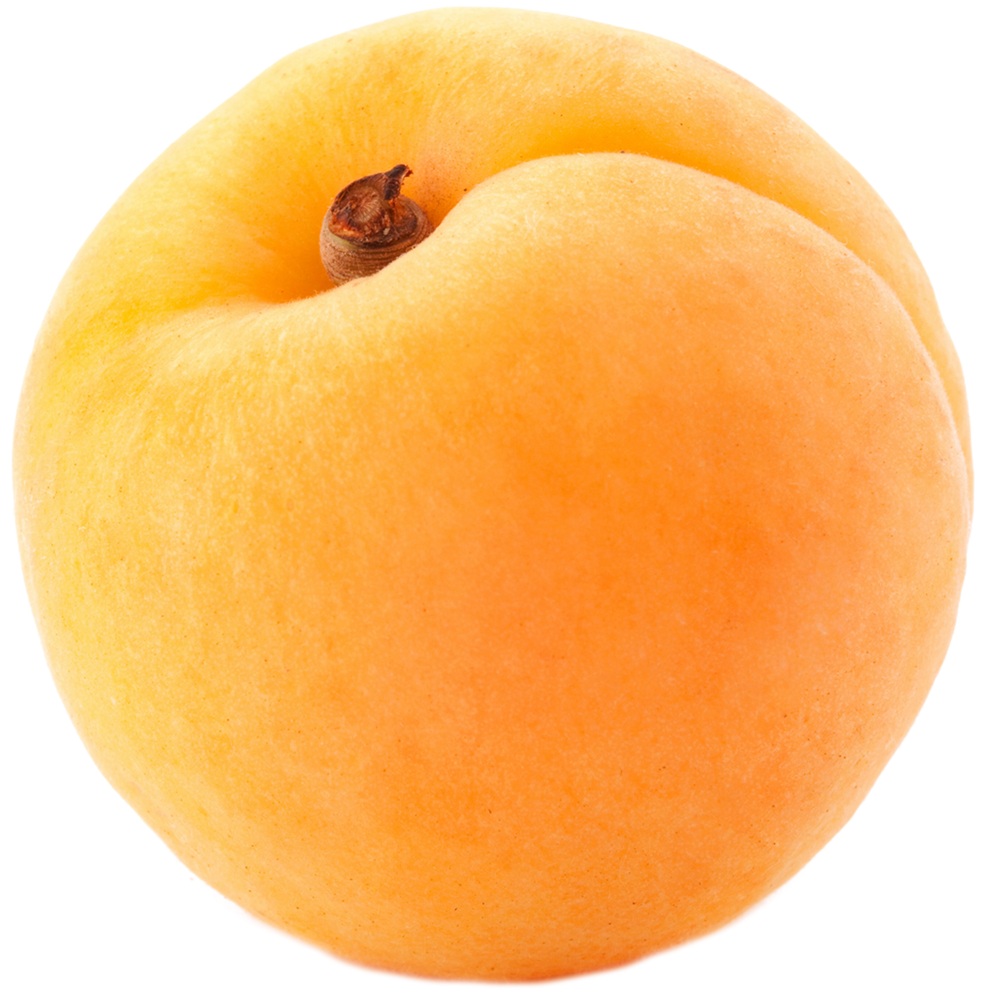

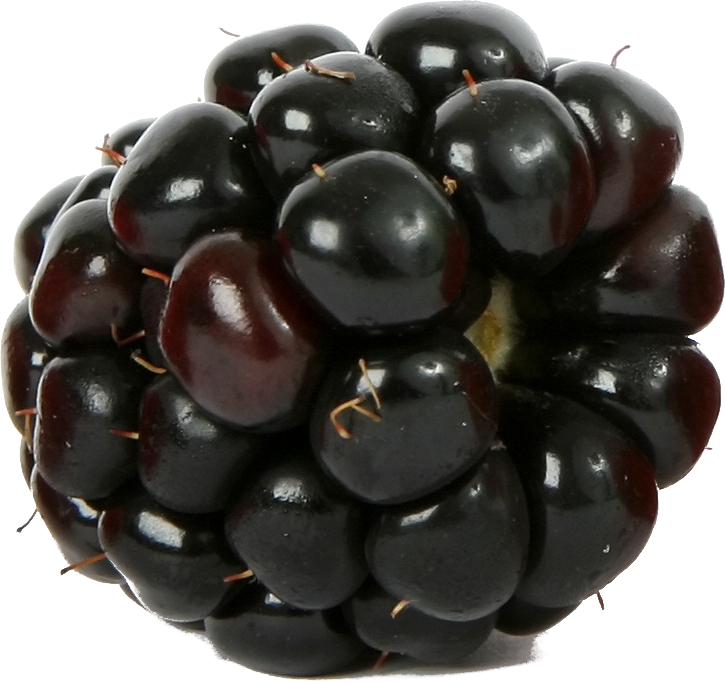

In [60]:
IMAGE_DIR = "./CLIP_Collage_ES/images/fruits"

imagepaths = glob(os.path.join(IMAGE_DIR, "*.png")) # small images that consist of the collage
NUM_IMAGES = len(imagepaths)
print("# of images: ", NUM_IMAGES)

# load all images
IMAGE_PATCHES = []
for path in imagepaths:
  IMAGE_PATCHES.append(Image.open(path).copy())

# show some samples
for path in imagepaths[:2]:
  ipd.display(ipd.Image(filename=path, width=100))

Global Constants

In [61]:
CANVAS_SIZE = 900 # the size of the collage canvas

DEFAULT_IMG_WIDTH = 225 # how big those small images should be in pixel
MIN_IMG_SCALE = 0.30  

GENE_LENGTH = 4 # number of genes for one small image (x, y, size, rotation)
NUM_REPEAT_IMAGES = 2 # how many times one small image should be used in the collage repeatedly

SOLUTION_LENGTH = GENE_LENGTH * NUM_IMAGES * NUM_REPEAT_IMAGES # the length of one gene
NUM_SOLUTIONS = 20 # population size

OUTPUT_IMAGE_POSTFIX = "output" 

In [62]:
#@title Text Prompt (input to the CLIP model)

TARGET_TEXT = 'a happy dog' #@param {type:"string"}

print(TARGET_TEXT)


a happy dog


## Initializing a CLIP model

In [63]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

if device is "cpu":
  print("Change your Runtime Type to GPU")

## Initializing PGPE algorhythm

In [64]:
pgpe = PGPE(
    solution_length= SOLUTION_LENGTH,   # A solution vector has the length of 5
    popsize= NUM_SOLUTIONS,          # Our population size

    optimizer='clipup',          # Uncomment these lines if you
    optimizer_config = dict(     # would like to use the ClipUp
       max_speed=0.15,           # optimizer.
       momentum=0.9
    ),

    #optimizer='adam',            # Uncomment these lines if you
    #optimizer_config = dict(     # would like to use the Adam
    #    beta1=0.9,               # optimizer.
    #    beta2=0.999,
    #    epsilon=1e-8
    #),
)


In [65]:
# Utility functions

def draw_gene(genes):
    canvas = Image.new('RGBA', (CANVAS_SIZE, CANVAS_SIZE), (255, 255, 255))

    num_genes = len(genes) // GENE_LENGTH
    for i in range(num_genes):
        gene = genes[i*GENE_LENGTH:(i+1)*GENE_LENGTH]

        # image        
        img_index = i % NUM_IMAGES
        im = IMAGE_PATCHES[img_index]
        
        # position
        x = int((gene[0] + 0.5)%1.0  * CANVAS_SIZE)
        y = int((gene[1] + 0.5)%1.0  * CANVAS_SIZE)       
        # rotation
        rot = gene[3] * 360.0
        im = im.rotate(rot, expand=True)
        # size
        w_coef = max(MIN_IMG_SCALE, pow(gene[2] + 1.0, 2.0))  # TO DO: better mapping? 
        org_w, org_h = im.size
        h = int(org_h * (DEFAULT_IMG_WIDTH / org_w))
        im.thumbnail((DEFAULT_IMG_WIDTH*w_coef, h*w_coef))

        # composite!
        canvas.paste(im, (x - im.width // 2, y - im.height // 2), im)
        #canvas.alpha_composite(im, (x, y))    
    return canvas

def evaluate_solution(genes, returns_image = False):
    # generate an image from genes
    canvas = draw_gene(genes)
    
    # evaluate how similar a generated image and the text prompt
    image = preprocess(canvas).unsqueeze(0).to(device)
    text = clip.tokenize([TARGET_TEXT]).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image).cpu().numpy()
        text_features = model.encode_text(text).cpu().numpy()

        sims = cosine_similarity(image_features, text_features)
        fitness_value = float(sims)
    
    if returns_image:
        return fitness_value, canvas
    return fitness_value


font_s = ImageFont.truetype("LiberationMono-Regular.ttf", size=18) 
def draw_fitness(canvas, gen, fitness):
    textcolor = (0, 0, 0) 
    draw = ImageDraw.Draw(canvas) 
    draw.text((20, 20), TARGET_TEXT, font=font_s, fill=textcolor)
    draw.text((20, 50), "Generation:%04d Fitness:%.2f" % (gen,fitness), font=font_s, fill=textcolor) 
    return canvas

## PGPE Optimization

Text Prompt: a happy dog

generate: 0 average: 0.1745


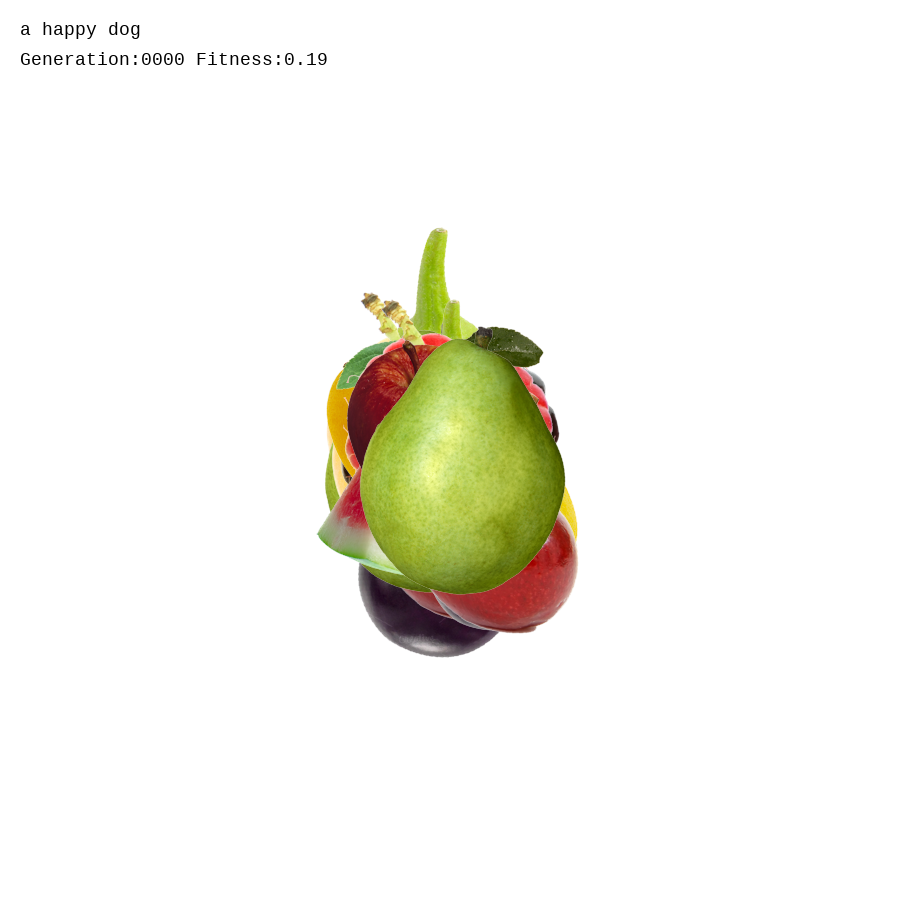

generate: 1 average: 0.1746
generate: 2 average: 0.1740
generate: 3 average: 0.1755
generate: 4 average: 0.1749
generate: 5 average: 0.1754
generate: 6 average: 0.1771
generate: 7 average: 0.1800
generate: 8 average: 0.1785
generate: 9 average: 0.1823
generate: 10 average: 0.1797
generate: 11 average: 0.1786
generate: 12 average: 0.1802
generate: 13 average: 0.1785
generate: 14 average: 0.1859
generate: 15 average: 0.1847
generate: 16 average: 0.1859
generate: 17 average: 0.1793
generate: 18 average: 0.1815
generate: 19 average: 0.1848
generate: 20 average: 0.1856


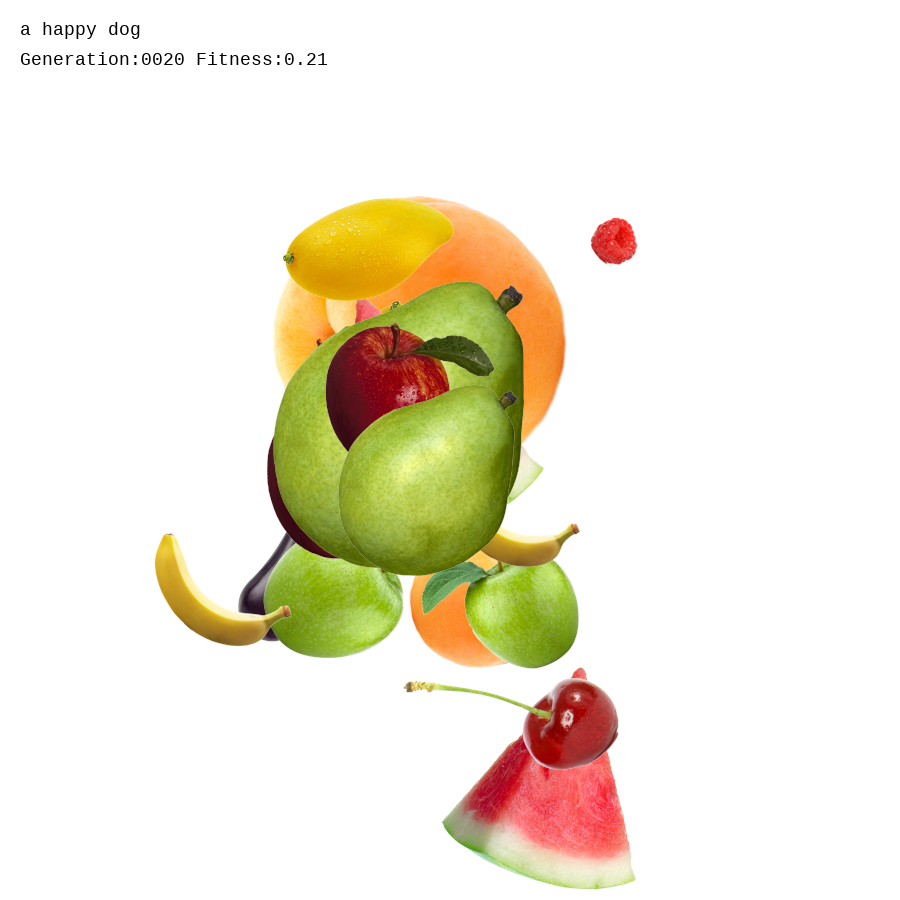

generate: 21 average: 0.1821
generate: 22 average: 0.1843
generate: 23 average: 0.1866
generate: 24 average: 0.1862
generate: 25 average: 0.1907
generate: 26 average: 0.1918
generate: 27 average: 0.1938
generate: 28 average: 0.1904
generate: 29 average: 0.1903
generate: 30 average: 0.1894
generate: 31 average: 0.1880
generate: 32 average: 0.1933
generate: 33 average: 0.1969
generate: 34 average: 0.1973
generate: 35 average: 0.1999
generate: 36 average: 0.2027
generate: 37 average: 0.1933
generate: 38 average: 0.2053
generate: 39 average: 0.2028
generate: 40 average: 0.1984


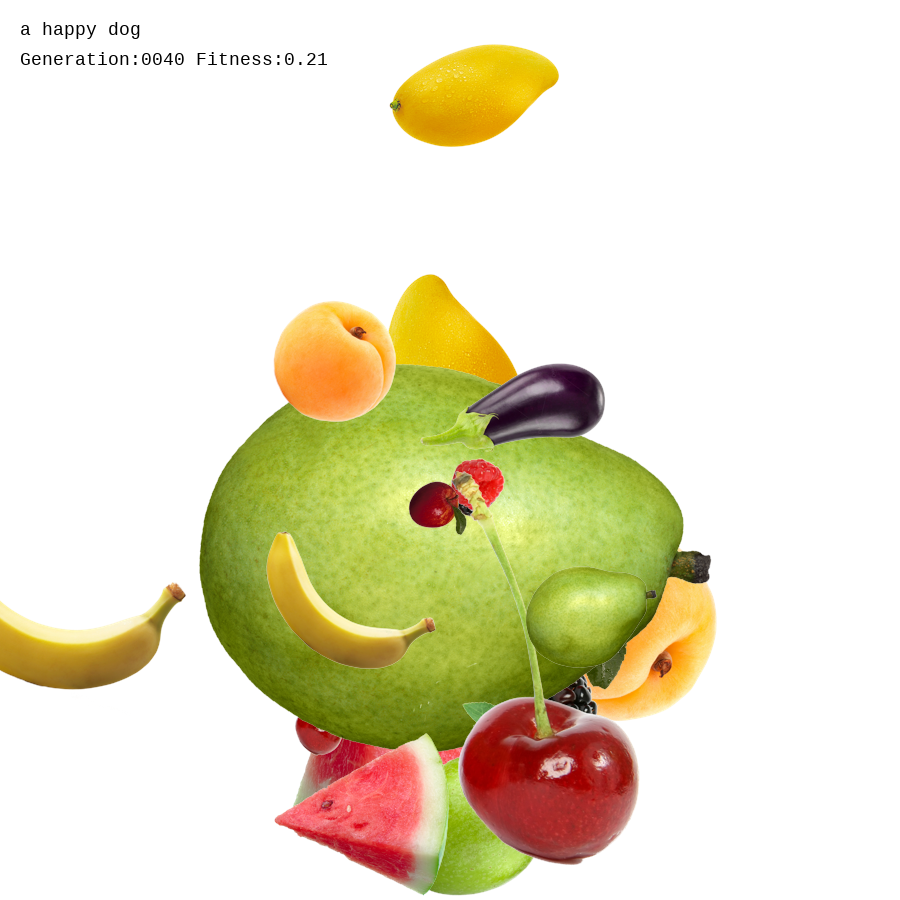

generate: 41 average: 0.2005
generate: 42 average: 0.2019
generate: 43 average: 0.2006
generate: 44 average: 0.2068
generate: 45 average: 0.2031
generate: 46 average: 0.1965
generate: 47 average: 0.2056
generate: 48 average: 0.2003
generate: 49 average: 0.2051
generate: 50 average: 0.2025
generate: 51 average: 0.2055
generate: 52 average: 0.2041
generate: 53 average: 0.2051
generate: 54 average: 0.2057
generate: 55 average: 0.2033
generate: 56 average: 0.2047
generate: 57 average: 0.2038
generate: 58 average: 0.2050
generate: 59 average: 0.2025
generate: 60 average: 0.2069


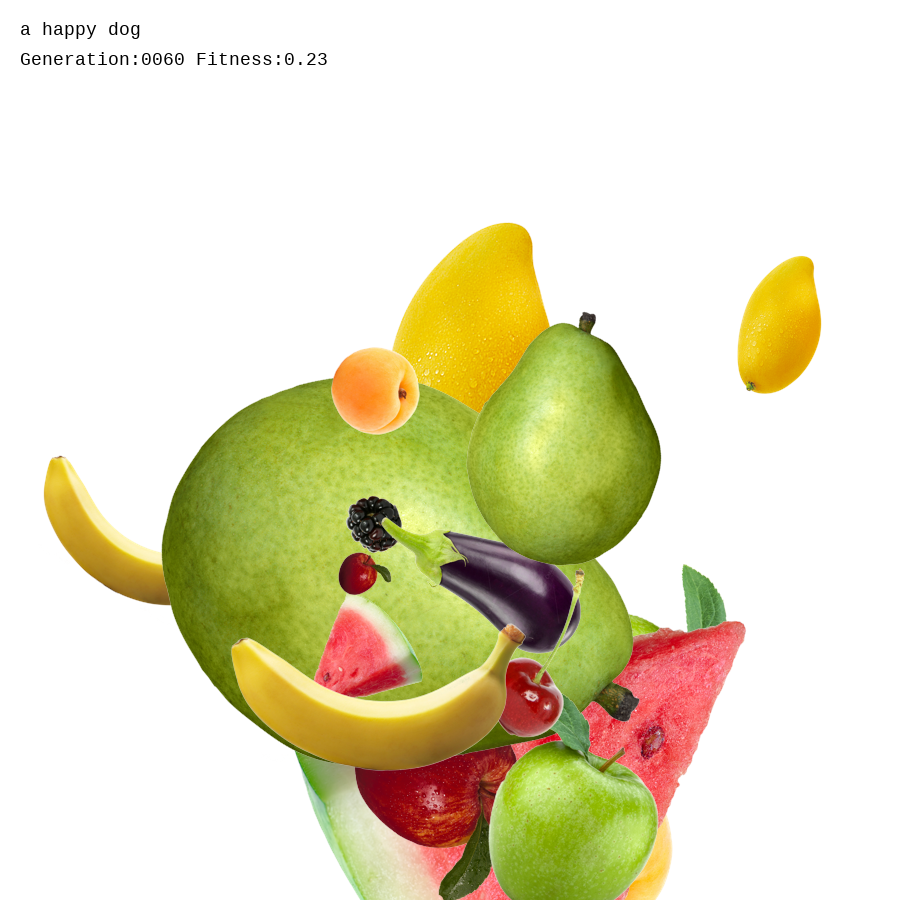

generate: 61 average: 0.2024
generate: 62 average: 0.2004
generate: 63 average: 0.2078
generate: 64 average: 0.2089
generate: 65 average: 0.2003
generate: 66 average: 0.2058
generate: 67 average: 0.2050
generate: 68 average: 0.2086
generate: 69 average: 0.2087
generate: 70 average: 0.2019
generate: 71 average: 0.2062
generate: 72 average: 0.2031
generate: 73 average: 0.2071
generate: 74 average: 0.2096
generate: 75 average: 0.2044
generate: 76 average: 0.2096
generate: 77 average: 0.2067
generate: 78 average: 0.2052
generate: 79 average: 0.2055
generate: 80 average: 0.2034


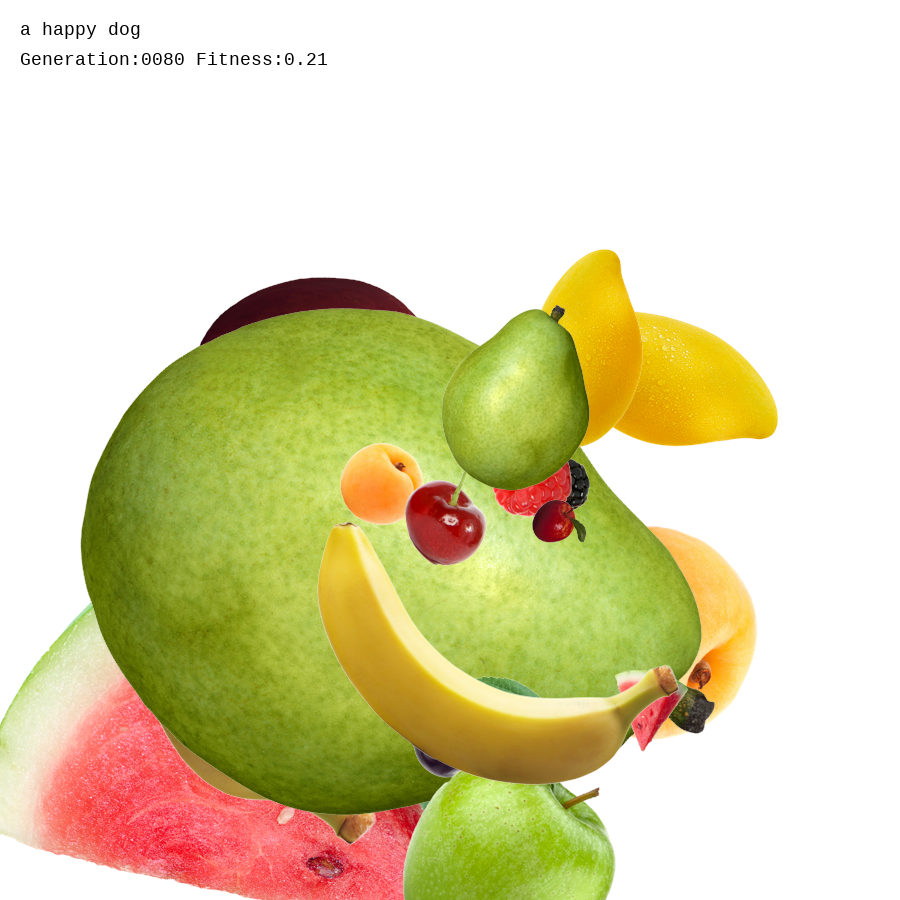

generate: 81 average: 0.2093
generate: 82 average: 0.2088
generate: 83 average: 0.2020
generate: 84 average: 0.2060
generate: 85 average: 0.2038
generate: 86 average: 0.2097
generate: 87 average: 0.2095
generate: 88 average: 0.2020
generate: 89 average: 0.2120
generate: 90 average: 0.2089
generate: 91 average: 0.2066
generate: 92 average: 0.2088
generate: 93 average: 0.2160
generate: 94 average: 0.2138
generate: 95 average: 0.2141
generate: 96 average: 0.2070
generate: 97 average: 0.2100
generate: 98 average: 0.2101
generate: 99 average: 0.2100
generate: 100 average: 0.2093


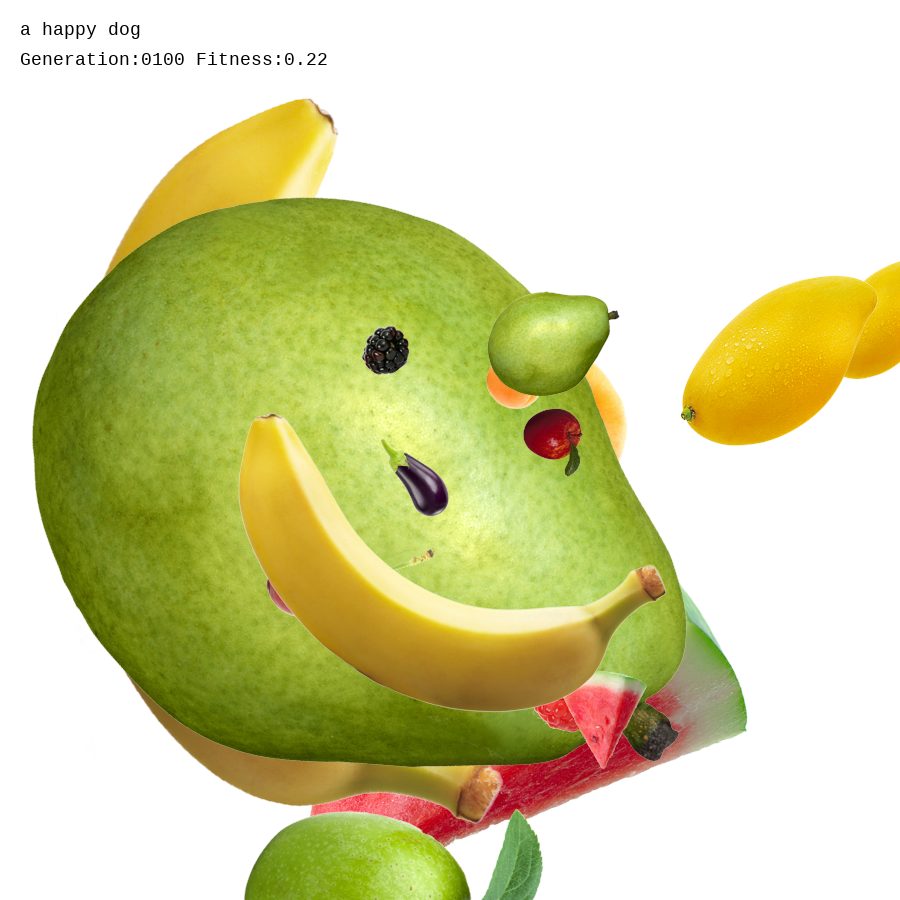

generate: 101 average: 0.2121
generate: 102 average: 0.2068
generate: 103 average: 0.2135
generate: 104 average: 0.2082
generate: 105 average: 0.2048
generate: 106 average: 0.2103
generate: 107 average: 0.2132
generate: 108 average: 0.2054
generate: 109 average: 0.2100
generate: 110 average: 0.2097
generate: 111 average: 0.2034
generate: 112 average: 0.2119
generate: 113 average: 0.2144
generate: 114 average: 0.2101
generate: 115 average: 0.2178
generate: 116 average: 0.2177
generate: 117 average: 0.2098
generate: 118 average: 0.2099
generate: 119 average: 0.2058
generate: 120 average: 0.2048


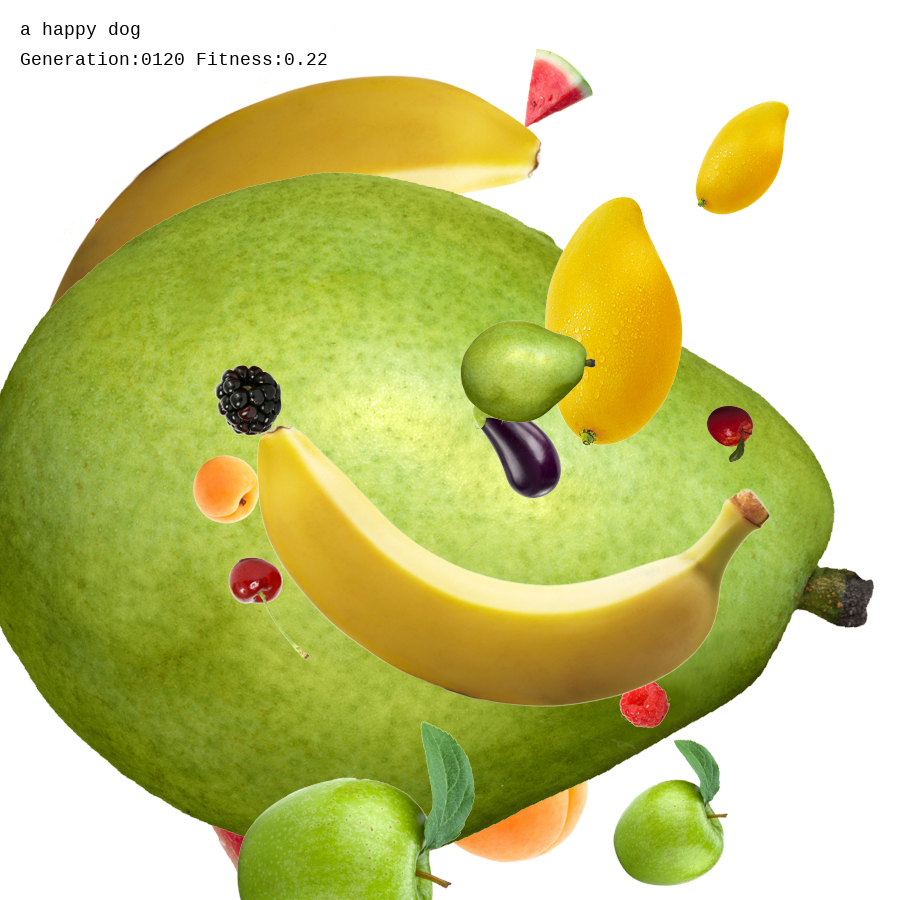

generate: 121 average: 0.2104
generate: 122 average: 0.2151
generate: 123 average: 0.2127
generate: 124 average: 0.2158
generate: 125 average: 0.2195
generate: 126 average: 0.2115
generate: 127 average: 0.2146
generate: 128 average: 0.2117
generate: 129 average: 0.2154
generate: 130 average: 0.2145
generate: 131 average: 0.2191


In [ ]:
best_fitness = 0.0
best_generation = 0
best_solution = None

print("Text Prompt:", TARGET_TEXT)
print()

for generation in range(1000):
    # create new solutions
    solutions = pgpe.ask()

    # evaluate fitnesses
    fitnesses = Parallel(n_jobs=-1,prefer="threads")(delayed(evaluate_solution)(genes) for genes in solutions)
    print("generate: %d average: %.4f" % (generation, np.mean(fitnesses)))

    # update the population  
    pgpe.tell(fitnesses)

    # Saving the best in the generation
    fitness, canvas = evaluate_solution(pgpe.center, returns_image=True)
    canvas = draw_fitness(canvas, generation, fitness)
    path = os.path.join("./output", "%04d_%0.4f_%s.png" % (generation, fitness, OUTPUT_IMAGE_POSTFIX))
    canvas.save(path)
    if generation % 20 == 0:
        ipd.display(ipd.Image(filename=path, width=400))

    # Store the best 
    if fitness > best_fitness:
      best_fitness = fitness
      best_generation = generation
      best_solution = pgpe.center
    
# After 1000 generations, we print the best solution.
print("The best solution: ")
fitness, canvas = evaluate_solution(best_solution, returns_image=True)
canvas = draw_fitness(canvas, generation, fitness)
path = os.path.join(".", "BEST_%04d_%0.4f.png" % (best_generation, best_fitness, OUTPUT_IMAGE_POSTFIX))
canvas.save(path)
ipd.display(ipd.Image(filename=path, width=400))

# Create a video

In [ ]:

import cv2
import os
from glob import glob

video_name = './%s.avi' % OUTPUT_IMAGE_POSTFIX
mp4_name = './%s.mp4' % OUTPUT_IMAGE_POSTFIX

images = glob("./output/*_%s.png" % OUTPUT_IMAGE_POSTFIX)
images = sorted(images)
frame_rate = 30

frame = cv2.imread(images[0])
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, frame_rate, (width,height))

for image_path in images:
    video.write(cv2.imread(image_path))

#cv2.destroyAllWindows()
video.release()

In [ ]:
!ffmpeg -i {video_name} {mp4_name}